![Astrofisica Computacional](../../logo.PNG)

---
## 36. Movimiento 3-Dimensional de un Cometa

Eduard Larrañaga (ealarranaga@unal.edu.co)

---

### Resumen

En este cuaderno se resuelven las ecuaciones de movimiento para un cometa que orbita el Sol en el espacio 3D.

---

## El Sistema Cometa-Sol

En este problema de aplicación se describe el movimiento de un cometa alrededor del Sol en el espacio 3-Dimensional. Se considera que el cometa tiene una masa muy pequeña comparada con la masa del Sol, $m \ll M$. Bajo esta suposición, el Sol permanecerá estático mientras que el cometa orbita a su alrededor bajo la influencia gravitacional. Esta suposición puede sustentarse al concocer que, por ejemplo, la masa del cometa Halley es $m \approx 2.2 \times 10^{14} \text{ kg}$, la cual es una cantidad pequeña al compararla con la masa del Sol, $M \approx 1.9 \times 10^{30}$ kg.

---
Las ecuaciones de movimiento del cometa, en coordenadas cartesianas con origen en el centro del Sol, son

\begin{align}
\frac{d^2 x}{dt^2} = &- \frac{GM}{(x^2 + y^2 + z^2)^{3/2}} x \\
\frac{d^2 y}{dt^2} = &- \frac{GM}{(x^2 + y^2 + z^2)^{3/2}} y \\
\frac{d^2 z}{dt^2} = &- \frac{GM}{(x^2 + y^2 + z^2)^{3/2}} z .
\end{align}

Para resolver este sistema de ODEs deben transformarse en un sistema diferencial de primer orden. Esto se logra al introducir las tres componentes cartesianas de la velocidad,

\begin{align}
\frac{d x}{dt} = &v^x \\
\frac{d y}{dt} = &v^y \\
\frac{d z}{dt} = &v^z \\
\frac{dv^x}{dt} = &- \frac{GM}{(x^2 + y^2 + z^2)^{3/2}} x \\
\frac{dv^y}{dt} = &- \frac{GM}{(x^2 + y^2 + z^2)^{3/2}} y \\
\frac{dv^z}{dt} = &- \frac{GM}{(x^2 + y^2 + z^2)^{3/2}} z .
\end{align}


Un aspecto importante para tener en cuenta son los grandes números involucrados si se utiliza el Sistema Internacional de Unidades en un problema dentro del sistema solar. Para tener mejores resultados, se tomará un sistema con las siguientes unidades de medida 

- unidad de masa: masa Solar $(M_{\odot})$
- unidad de distancia: Unidad Astronómica $(\text{ au})$
- unidad de tiemo: año $(yr)$

En este sistema de unidades, la constante gravitacional Newtoniana tiene el valor $G = 4\pi^2$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d as Axes3D
# %matplotlib notebook  # Makes interactive the 3D plot when running locally! 


# Relevant Constants in the units
# (years, AU, Solar_masses)
# Newtonian Gravitational Constant
G = 4.*np.pi**2
M = 1.

El sistema de ODEs es implementado al definir la función

In [2]:
def ODE(t0, q0):
    '''
    ------------------------------------------
    ODE(t,q0) 
    ------------------------------------------
    ODEs system for the motion of the comet 
    
    Arguments:
    t0: time parameter (not necessary for 
        the Newtonian problem)
    q0: numpy array with the initial condition
        data
        q0 = [x0, y0, z0, vx0, vy0, vz0]
    mass: masses of the particles
    ------------------------------------------
    '''
    r = q0[0]**2 + q0[1]**2 + q0[2]**2
    f = np.zeros(6)
    f[0] = q0[3]
    f[1] = q0[4]
    f[2] = q0[5]
    f[3] = - G*M*q0[0]/r**(3/2)
    f[4] = - G*M*q0[1]/r**(3/2)
    f[5] = - G*M*q0[2]/r**(3/2)
    return f

## Conservación de la Energía

Ya que la energía mecánica total se conserva, se puede utilizar como un criterio para estudiar el procedimiento de integración.

\begin{equation}
\frac{E}{m} = \frac{1}{2} |\vec{v}|^2 -\frac{1}{2} \frac{GM}{r}
\end{equation}

In [3]:
def TotalEnergy(q):
  '''
  ------------------------------------------
  TotalEnergy(q)
  ------------------------------------------
  Evaluates the total energy for the system 
  ------------------------------------------
  Arguments:
  q: NumPy array with the state of the 
     system in the format
     q = [x, y, z, vx, vy, vz]
  ------------------------------------------
  Returns:
  E : Total Energy
  ------------------------------------------
  '''
  v2 = q[3]**2 + q[4]**2 + q[5]**2
  r = np.sqrt(q[0]**2 + q[1]**2 + q[2]**2)
  E = v2/2 - G*M/r
  return E


Para resolver el problema utilizaremos un integrador RK4,

In [4]:
def RK4(h, t0, q0):
    '''
    ------------------------------------------
    RK4(h, t0, q0)
    ------------------------------------------
    4th Order Runge-Kutta method for solving 
    a system of ODEs.
    Arguments:
    ODE: function defining the system of ODEs
    h: stepsize for the iteration
    t0: independent parameter initial value
    q0: numpy array with the initial values of
        the functions in the ODEs system
    ------------------------------------------
    '''
    k1 = h*ODE(t0, q0)
    k2 = h*ODE(t0 + h/2., q0 + k1/2.)
    k3 = h*ODE(t0 + h/2., q0 + k2/2.)
    k4 = h*ODE(t0 + h, q0 + k3)
    q1 = q0 + (k1 + 2.*k2 + 2.*k3 + k4)/6.
    return q1


--- 
## Condición Inicial

Las condiciones inciales se han escogido de tal forma que el plano orbital no es el plano x-y  y se dan en el sistema de unidades definido arriba ($M_{\odot}$, ua, yr).


In [5]:

# Creation of the time grid (in years)
t_0 = 0.
t_f = 10.

# Number of steps in the grid
n = 100000

t = np.linspace(t_0, t_f, n)

# Constant stepsize defined by the number of steps in the grid
dt = (t_f - t_0)/n

# Array with the initial conditions for all particles
Q = np.zeros([n, 6]) # array [steps, 6 variables]

# Array with the information of total energy
Energy = np.zeros(n)

# Initial condition

Q[0,0] = 1.
Q[0,1] = 0.
Q[0,2] = 0.
Q[0,3] = 0.2
Q[0,4] = 1.5
Q[0,5] = 1.

Energy[0] = TotalEnergy(Q[0])

##  Loop Principal y Gráficos

En el loop principal se llama al método RK4 para actualizar los datos de posición, velocidad y energía del sistema. Los valores son guardados en el arreglo `q`, y con ello se realiza un gráfico 3D y se revisa la conservación de la energía.

In [6]:

for i in range(n-1):
  Q[i+1] = RK4(dt, t[i], Q[i])
  Energy[i+1] = TotalEnergy(Q[i])


In [7]:
# Set boundaries for the plot
maximum = max(np.max(Q[:,0]), np.max(Q[:,1]), np.max(Q[:,2]))
minimum = min(np.min(Q[:,0]), np.min(Q[:,1]), np.min(Q[:,2]))
boundary = max(abs(maximum), abs(minimum))*(1+0.01) # Limit for the axis range

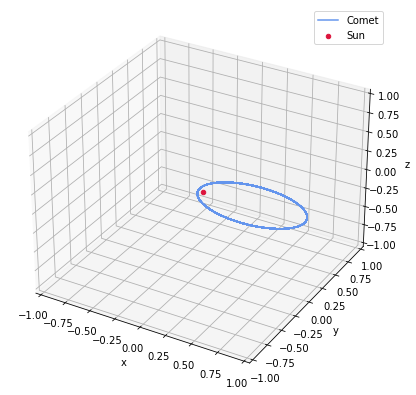

In [8]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(projection='3d')

ax.scatter(0., 0., 0., color=('crimson'), label='Sun')
ax.plot(Q[:,0], Q[:,1], Q[:,2], color=('cornflowerblue'), label='Comet')

ax.set_xlim3d(-boundary, boundary)
ax.set_ylim3d(-boundary, boundary)
ax.set_zlim3d(-boundary, boundary)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.legend()
#plt.savefig(path+'cometAroundtheSun.jpg')
plt.show()

In [9]:
energychange = (Energy[n-1]-Energy[0])/Energy[0]
print(f'El cambio relativo en la energía es {energychange:.5E} % con un tamaño de paso dt = {dt:.1E}')

El cambio relativo en la energía es 6.70032E-05 % con un tamaño de paso dt = 1.0E-04


---
## Gráfico interactivo utilizando  [Plotly](https://plotly.com)

Ahora se mostrará la orbita mediante un gráfico interactivo utilizando la función [plotly.graph_objects.Scatter3d()](https://plotly.com/python/reference/scatter3d/)

Algunos ejemplos del uso de esta función se pueden ver en https://plotly.com/python/3d-scatter-plots/ 

In [10]:
import plotly.graph_objects as go

# Orbits 
x1, y1, z1 = [0.], [0.], [0.]
x2, y2, z2 = Q[:,0],Q[:,1],Q[:,2]


fig = go.Figure()
fig.add_trace(go.Scatter3d(x=x1, y=y1, z=z1,
                                   mode='markers',
                                   marker=dict(
                                       size=3 ,
                                       color='red'),
                                   name='Sun'))
fig.add_trace(go.Scatter3d(x=x2, y=y2, z=z2,
                                   mode='markers',
                                   marker=dict(
                                       size=1,
                                       color='blue'),
                                   name='Comet'))
fig.update_layout(
    scene = dict(
        xaxis = dict(nticks=5, range=[-boundary,boundary]),
        yaxis = dict(nticks=5, range=[-boundary,boundary]),
        zaxis = dict(nticks=5, range=[-boundary,boundary]),))
fig.show()

In [12]:
np.savetxt('comet_orbit3D.txt', Q, header='x y z vx vy vz')